# Fastpages Notebook Blog Post
> A tutorial of fastpages for Jupyter notebooks.

- toc: true 
- badges: true
- comments: true
- categories: [jupyter]
- image: images/chart-preview.png

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import pandas as pd
import numpy as np
import load_covid_data
from IPython.display import display, Markdown
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import arviz as az
import pymc3 as pm 
import altair as alt

sns.set_context('talk')
plt.style.use('seaborn-whitegrid')

debug=False

ModuleNotFoundError: No module named 'load_covid_data'

In [134]:
df = load_covid_data.load_data(drop_states=True, filter_n_days_100=2)

In [135]:
df = df.loc[lambda x: x.country != 'Chinal (total)']
countries = df.country.unique()
n_countries = len(countries)
df = df.loc[lambda x: (x.days_since_100 >= 0)]

In [136]:
df.index.max().strftime('%B %d, %Y')

'March 28, 2020'

In [137]:
annotate_kwargs = dict(
    s='Dateset by COVID Data Repository by Johns Hopkins CSSE ({})\nBy Guilherme Diaz-Berrio, based on the work by Thomas Wiecki'.format(df.index.max().strftime('%B %d, %Y')), 
    xy=(0.05, 0.01), xycoords='figure fraction', fontsize=10)

In [138]:
annotate_kwargs

{'s': 'Dateset by COVID Data Repository by Johns Hopkins CSSE (March 28, 2020)\nBy Guilherme Diaz-Berrio, based on the work by Thomas Wiecki',
 'xy': (0.05, 0.01),
 'xycoords': 'figure fraction',
 'fontsize': 10}

In [139]:
',  '.join(countries.tolist())

'Albania,  Algeria,  Andorra,  Argentina,  Armenia,  Austria,  Azerbaijan,  Bahrain,  Belgium,  Bosnia and Herzegovina,  Brazil,  Brunei,  Bulgaria,  Burkina Faso,  Chile,  Hong Kong,  Colombia,  Costa Rica,  Croatia,  Diamond Princess,  Cyprus,  Czechia,  Denmark,  Dominican Republic,  Ecuador,  Egypt,  Estonia,  Finland,  France,  Germany,  Ghana,  Greece,  Hungary,  Iceland,  India,  Indonesia,  Iran,  Iraq,  Ireland,  Israel,  Italy,  Japan,  Jordan,  Kazakhstan,  Korea, South,  Kuwait,  Latvia,  Lebanon,  Lithuania,  Luxembourg,  Malaysia,  Malta,  Mexico,  Moldova,  Morocco,  Netherlands,  New Zealand,  North Macedonia,  Norway,  Oman,  Pakistan,  Panama,  Peru,  Philippines,  Poland,  Portugal,  Qatar,  Romania,  Russia,  San Marino,  Saudi Arabia,  Senegal,  Serbia,  Singapore,  Slovakia,  Slovenia,  South Africa,  Spain,  Sri Lanka,  Sweden,  Switzerland,  Taiwan*,  Thailand,  Tunisia,  Turkey,  Ukraine,  United Arab Emirates,  United Kingdom,  Uruguay,  US,  Venezuela,  Vietn

In [143]:
with pm.Model() as exp_model:
    # Intercept
    a_grp = pm.Normal('a_grp', 100, 50) # Group Mean
    a_grp_sigma = pm.HalfNormal('a_grp_sigma', 50) # Group Variance
    a_ind = pm.Normal('a_ind', mu=a_grp, sigma=a_grp_sigma, shape=n_countries) # Individual Intercepts

    # Slope
    b_grp = pm.Normal('b_grp', 1.33, 0.5) # Group Mean
    b_grp_sigma = pm.HalfNormal('b_grp_sigma', .5) # Group Variance
    b_ind = pm.Normal('b_ind', mu=b_grp, sigma=b_grp_sigma, shape=n_countries) # Individual slopes

    # Error
    sigma = pm.HalfNormal('sigma', 500., shape=n_countries)

    # Create likelihood for each country
    for i, country in enumerate(countries):
        df_country = df.loc[lambda x: (x.country == country)]
        # By using pm.Data we can change these values after sampling.
        # This allows us to extend x into the future so we can get
        # forecasts by sampling from the posterior predictive
        x = pm.Data(country + "x_data", df_country.days_since_100.values)
        confirmed = pm.Data(country + "y_data", df_country.confirmed.astype('float64').values)

        # Likelihood
        pm.NegativeBinomial(
            country,
            (a_ind[i] * b_ind[i] ** x), # Exponential Regression
            sigma[i],
            observed=confirmed)

In [144]:
with exp_model:
    trace = pm.sample(tune=1500, chains=2, cores=1, target_accept=.9)

    # update data so we get predictions into the future
    for country in countries:
        df_country = df.loc[lambda x: (x.country == country)]
        x_data = np.arange(0, 45)
        y_data = np.array([np.nan] * len(x_data))
        pm.set_data({country + "x_data": x_data})
        pm.set_data({country + "y_data": y_data})
    
    post_pred = pm.sample_posterior_predictive(trace, samples=80)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, b_ind, b_grp_sigma, b_grp, a_ind, a_grp_sigma, a_grp]
Sampling chain 1, 0 divergences: 100%|█████████████████████████████████████████████| 2000/2000 [24:25<00:00,  1.36it/s]
The acceptance probability does not match the target. It is 0.9766857378384846, but should be close to 0.9. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.9714740509025667, but should be close to 0.9. Try to increase the number of tuning steps.
C:\Users\gdb\AppData\Local\Continuum\anaconda3\lib\site-packages\pymc3\sampling.py:1247: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "
  1%|█                                                                

ValueError: lam value too large

In [119]:
# flatten predictions & target for each country into a pandas DataFrame
predictions_dfs_list = []

for country in post_pred:
    arr = post_pred[country]
    preds = arr.flatten().tolist() # get predictions in flattened array
    pred_idx = np.indices(arr.shape)[0].flatten().tolist() # predictions for the model (grey lines)
    days_since = np.indices(arr.shape)[1].flatten().tolist() # days since 100 cases
    pred_df = pd.DataFrame(
        {
            'country': country,
            'predictions': preds,
            'pred_idx': pred_idx,
            'days_since_100': days_since
        }
    )
    predictions_dfs_list.append(pred_df)

predictionsDF = pd.concat(predictions_dfs_list)

# Compute the maximum value to plot on the y-axis as 15x the last confirmed case
ylims = pd.DataFrame(df.groupby('country').last().confirmed * 15).reset_index()
ylims.columns = ['country', 'ylim']

# filter predictions that exceed ylims
predictionsDF_filtered = (predictionsDF.merge(ylims, on='country', how='left').loc[lambda x: x.predictions <= x.ylim])

# compute 33% daily growth rate for reference
first_case_count = df.groupby('country').first().confirmed.reset_index()
date_anchor = predictionsDF_filtered[['country', 'days_since_100']].drop_duplicates()
max_pred = predictionsDF_filtered.groupby('country').max()[['predictions']].reset_index()
benchmark = (date_anchor
             .merge(first_case_count, on='country', how='left')
             .merge(max_pred, on='country', how='left'))
benchmark['benchmark'] = benchmark.apply(lambda x: x.confirmed * (1.3 ** (x.days_since_100)), axis=1)
benchmarkDF_filtered = benchmark.loc[lambda x: x.benchmark <= x.predictions]

# compute last known confirmed case
lastpointDF = df.groupby('country').last().reset_index()

# DF of chart titles. Hack for Altiar to switch values
titleDF = lastpointDF[['country']]
titleDF['title'] = titleDF.apply(lambda x: x.country + ': Actual vs Predicted Growth', axis=1)

C:\Users\gdb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


'Country Mean Growth - Italy:21.03937347912671'

'Country Mean Growth - Portugal:28.552267573492166'

'Country Mean Growth - Spain:29.541861982198792'

'Country Mean Growth - France (total):16.680928284662446'

'Country Mean Growth - United Kingdom (total):24.526988778914767'

'Country Mean Growth - Japan:7.354671198062449'

'Country Mean Growth - Korea, South:13.963748866984483'

'Country Mean Growth - Singapore:8.305400197697537'

'Country Mean Growth - China (total):16.693933862488556'

Text(0.5, 0.98, 'Posterior of daily growth')

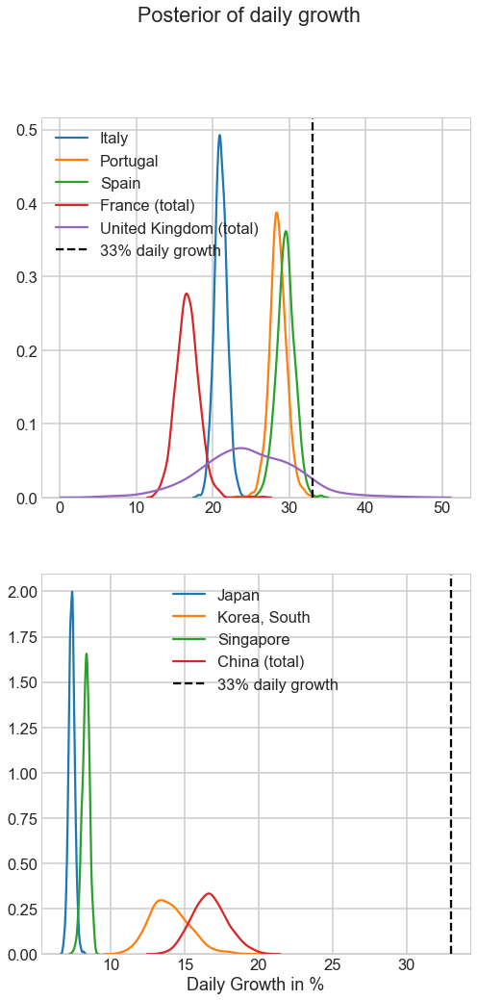

In [120]:
european_countries = ['Italy', 'Spain', 'United Kingdom (total)', 'France (total)', 'Portugal']
asian_countries = ['Korea, South', 'Japan', 'China (total)', 'Singapore']
country_groups = [european_countries, asian_countries]
line_styles = ['-', ':', '--', '-.']

fig, axs = plt.subplots(nrows=len(country_groups), figsize=(8, 16), sharex=False)

for ax, country_group in zip(axs, country_groups):
    for i, country in enumerate(countries):
        if country in country_group:
            sns.distplot((trace['b_ind'][:, i] * 100) - 100, ax=ax, label=country, hist=False)
            display(f"Country Mean Growth - {country}:{np.mean((trace['b_ind'][:, i] * 100) - 100)}")
    ax.axvline(33, ls='--', color='k', label='33% daily growth')
    ax.legend()
ax.set_xlabel('Daily Growth in %')
plt.suptitle('Posterior of daily growth')

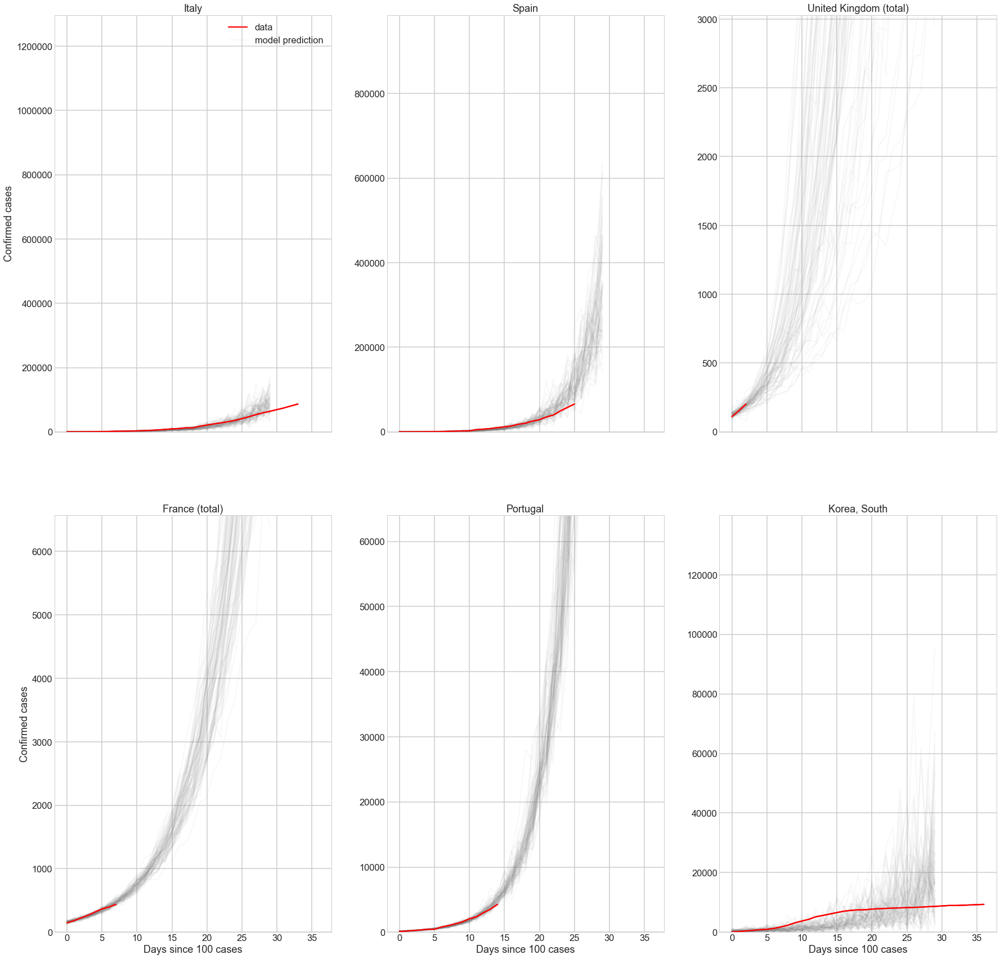

In [121]:
# Charts Linear Scale
sub_countries = ['Italy', 'Spain', 'United Kingdom (total)', 'France (total)', 'Portugal', 'Korea, South']

fig, axs = plt.subplots(nrows=(len(sub_countries) // 3), ncols=3, figsize=(30, 30), sharex=True)

for ax, country in zip(axs.flatten(), sub_countries):
    df_country = df.loc[lambda x: x.country == country]
    ax.plot(df_country.days_since_100, df_country.confirmed, color='r')
    ax.plot(np.arange(0, post_pred[country].shape[1]), post_pred[country].T, alpha=.05, color='.5')
    ax.plot(df_country.days_since_100, df_country.confirmed, color='r')
    ax.set_ylim(0, df_country.confirmed.iloc[-1] * 15)
    ax.set_title(country)

axs[0, 0].legend(['data', 'model prediction'])
[ax.set(xlabel='Days since 100 cases') for ax in axs[-1, :]]
[ax.set(ylabel='Confirmed cases') for ax in axs[:, 0]]
plt.show()

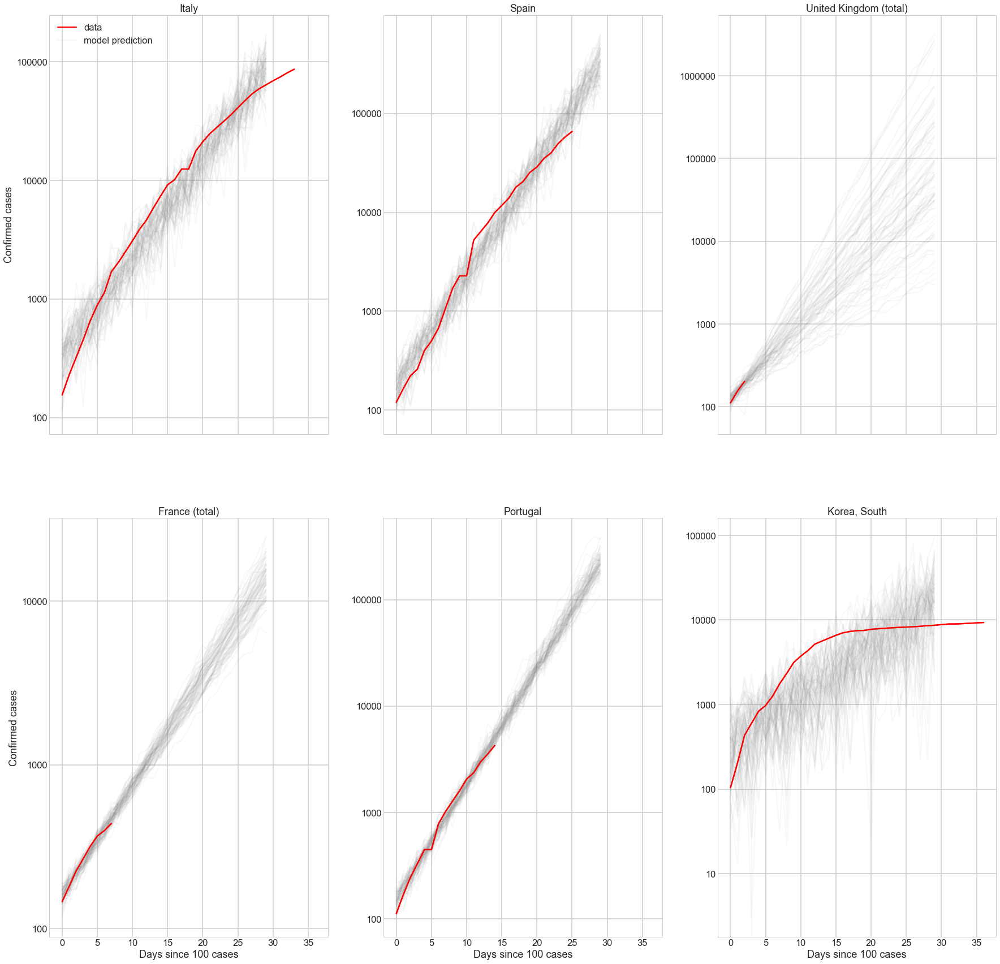

In [122]:
# Charts Log Scale

sub_countries = ['Italy', 'Spain', 'United Kingdom (total)', 'France (total)', 'Portugal', 'Korea, South']

fig, axs = plt.subplots(nrows=(len(sub_countries) // 3), ncols=3, figsize=(30, 30), sharex=True)

for ax, country in zip(axs.flatten(), sub_countries):
    df_country = df.loc[lambda x: x.country == country]
    ax.plot(df_country.days_since_100, df_country.confirmed, color='r')
    ax.plot(np.arange(0, post_pred[country].shape[1]), post_pred[country].T, alpha=.05, color='.5')
    ax.plot(df_country.days_since_100, df_country.confirmed, color='r')
    ax.set_yscale('log')
    ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    ax.set_title(country)

axs[0, 0].legend(['data', 'model prediction'])
[ax.set(xlabel='Days since 100 cases') for ax in axs[-1, :]]
[ax.set(ylabel='Confirmed cases') for ax in axs[:, 0]]
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001741C4FCA20>,
      dtype=object)

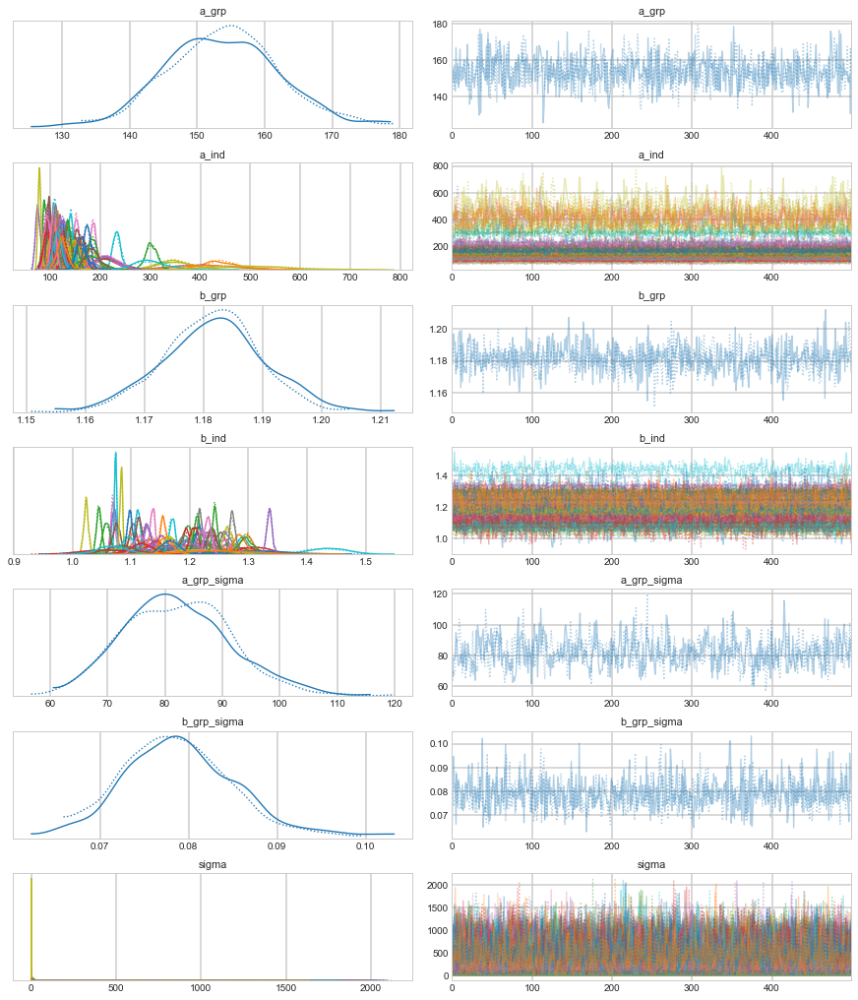

In [123]:
az.plot_trace(trace, compact=True)